# Human Connectome Project (HCP) Dataset loader

The HCP dataset comprises resting-state and task-based fMRI from a large sample of human subjects. The NMA-curated dataset includes time series data that has been preprocessed and spatially-downsampled by aggregating within 360 regions of interest.

In [3]:
import os
import numpy as np
import matplotlib.pyplot as plt

In [4]:
#@title Figure settings
%matplotlib inline
%config InlineBackend.figure_format = 'retina'
# plt.style.use("https://raw.githubusercontent.com/NeuromatchAcademy/course-content/master/nma.mplstyle")

In [5]:
HCP_DIR = "./hcp"

# Basic parameters

In [6]:

# The download cells will store the data in nested directories starting here:
HCP_DIR = "./hcp"
if not os.path.isdir(HCP_DIR):
  os.mkdir(HCP_DIR)

# The data shared for NMA projects is a subset of the full HCP dataset
N_SUBJECTS = 339

# The data have already been aggregated into ROIs from the Glasesr parcellation
N_PARCELS = 360

# The acquisition parameters for all tasks were identical
TR = 0.72  # Time resolution, in sec

# The parcels are matched across hemispheres with the same order
HEMIS = ["Right", "Left"]

# Each experiment was repeated multiple times in each subject
N_RUNS_REST = 4
N_RUNS_TASK = 2

# Time series data are organized by experiment, with each experiment
# having an LR and RL (phase-encode direction) acquistion
BOLD_NAMES = [
  "rfMRI_REST1_LR", "rfMRI_REST1_RL",
  "rfMRI_REST2_LR", "rfMRI_REST2_RL",
  "tfMRI_MOTOR_RL", "tfMRI_MOTOR_LR",
  "tfMRI_WM_RL", "tfMRI_WM_LR",
  "tfMRI_EMOTION_RL", "tfMRI_EMOTION_LR",
  "tfMRI_GAMBLING_RL", "tfMRI_GAMBLING_LR",
  "tfMRI_LANGUAGE_RL", "tfMRI_LANGUAGE_LR",
  "tfMRI_RELATIONAL_RL", "tfMRI_RELATIONAL_LR",
  "tfMRI_SOCIAL_RL", "tfMRI_SOCIAL_LR"
]

# You may want to limit the subjects used during code development.
# This will use all subjects:
subjects = range(N_SUBJECTS)

# Downloading data

The rest and task data are shared in different files, but they will unpack into the same directory structure.

Each file is fairly large and will take some time to download. If you are focusing only on rest or task analyses, you may not want to download only that dataset.

We also separately provide some potentially useful behavioral covariate information.

In [13]:
fname = "hcp_rest.tgz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/bqp7m/download/
  print('wget is done')  
  !tar -xzf $fname -C $HCP_DIR --strip-components=1

wget is done


In [14]:
fname = "hcp_task.tgz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/s4h8j/download/
  print('wget is done')  
  !tar -xzf $fname -C $HCP_DIR --strip-components=1
  print('tar is done')  

wget is done
tar is done


In [15]:
fname = "hcp_covariates.tgz"
if not os.path.exists(fname):
  !wget -qO $fname https://osf.io/x5p4g/download/
  print('wget is done')  
  !tar -xzf $fname -C $HCP_DIR --strip-components=1
  print('tar is done')  

wget is done
tar is done


## Loading region information

Downloading either dataset will create the `regions.npy` file, which contains the region name and network assignment for each parcel.

Detailed information about the name used for each region is provided [in the Supplement](https://static-content.springer.com/esm/art%3A10.1038%2Fnature18933/MediaObjects/41586_2016_BFnature18933_MOESM330_ESM.pdf) to [Glasser et al. 2016](https://www.nature.com/articles/nature18933).

Information about the network parcellation is provided in [Ji et al, 2019](https://www.ncbi.nlm.nih.gov/pmc/articles/PMC6289683/).

In [7]:
regions = np.load(f"{HCP_DIR}/regions.npy").T
region_info = dict(
    name=regions[0].tolist(),
    network=regions[1],
    myelin=regions[2].astype(np.float),
)

# Helper functions


## Data loading

In [8]:
def get_image_ids(name):
  """Get the 1-based image indices for runs in a given experiment.

    Args:
      name (str) : Name of experiment ("rest" or name of task) to load
    Returns:
      run_ids (list of int) : Numeric ID for experiment image files

  """
  run_ids = [
    i for i, code in enumerate(BOLD_NAMES, 1) if name.upper() in code
  ]
  if not run_ids:
    raise ValueError(f"Found no data for '{name}''")
  return run_ids

def load_timeseries(subject, name, runs=None, concat=True, remove_mean=True):
  """Load timeseries data for a single subject.
  
  Args:
    subject (int): 0-based subject ID to load
    name (str) : Name of experiment ("rest" or name of task) to load
    run (None or int or list of ints): 0-based run(s) of the task to load,
      or None to load all runs.
    concat (bool) : If True, concatenate multiple runs in time
    remove_mean (bool) : If True, subtract the parcel-wise mean

  Returns
    ts (n_parcel x n_tp array): Array of BOLD data values

  """
  # Get the list relative 0-based index of runs to use
  if runs is None:
    runs = range(N_RUNS_REST) if name == "rest" else range(N_RUNS_TASK)
  elif isinstance(runs, int):
    runs = [runs]

  # Get the first (1-based) run id for this experiment 
  offset = get_image_ids(name)[0]

  # Load each run's data
  bold_data = [
      load_single_timeseries(subject, offset + run, remove_mean) for run in runs
  ]

  # Optionally concatenate in time
  if concat:
    bold_data = np.concatenate(bold_data, axis=-1)

  return bold_data


def load_single_timeseries(subject, bold_run, remove_mean=True):
  """Load timeseries data for a single subject and single run.
  
  Args:
    subject (int): 0-based subject ID to load
    bold_run (int): 1-based run index, across all tasks
    remove_mean (bool): If True, subtract the parcel-wise mean

  Returns
    ts (n_parcel x n_timepoint array): Array of BOLD data values

  """
  bold_path = f"{HCP_DIR}/subjects/{subject}/timeseries"
  bold_file = f"bold{bold_run}_Atlas_MSMAll_Glasser360Cortical.npy"
  ts = np.load(f"{bold_path}/{bold_file}")
  if remove_mean:
    ts -= ts.mean(axis=1, keepdims=True)
  return ts

def load_evs(subject, name, condition):
  """Load EV (explanatory variable) data for one task condition.

  Args:
    subject (int): 0-based subject ID to load
    name (str) : Name of task
    condition (str) : Name of condition

  Returns
    evs (list of dicts): A dictionary with the onset, duration, and amplitude
      of the condition for each run.

  """
  evs = []
  for id in get_image_ids(name):
    task_key = BOLD_NAMES[id - 1]
    ev_file = f"{HCP_DIR}/subjects/{subject}/EVs/{task_key}/{condition}.txt"
    ev = dict(zip(["onset", "duration", "amplitude"], np.genfromtxt(ev_file).T))
    evs.append(ev)
  return evs

## Task-based analysis

In [9]:
def condition_frames(run_evs, skip=0):
  """Identify timepoints corresponding to a given condition in each run.

  Args:
    run_evs (list of dicts) : Onset and duration of the event, per run
    skip (int) : Ignore this many frames at the start of each trial, to account
      for hemodynamic lag

  Returns:
    frames_list (list of 1D arrays): Flat arrays of frame indices, per run

  """
  frames_list = []
  for ev in run_evs:

    # Determine when trial starts, rounded down
    start = np.floor(ev["onset"] / TR).astype(int)

    # Use trial duration to determine how many frames to include for trial
    duration = np.ceil(ev["duration"] / TR).astype(int)

    # Take the range of frames that correspond to this specific trial
    frames = [s + np.arange(skip, d) for s, d in zip(start, duration)]

    frames_list.append(np.concatenate(frames))

  return frames_list


def selective_average(timeseries_data, ev, skip=0):
  """Take the temporal mean across frames for a given condition.

  Args:
    timeseries_data (array or list of arrays): n_parcel x n_tp arrays
    ev (dict or list of dicts): Condition timing information
    skip (int) : Ignore this many frames at the start of each trial, to account
      for hemodynamic lag

  Returns:
    avg_data (1D array): Data averagted across selected image frames based
    on condition timing

  """
  # Ensure that we have lists of the same length
  if not isinstance(timeseries_data, list):
    timeseries_data = [timeseries_data]
  if not isinstance(ev, list):
    ev = [ev]
  if len(timeseries_data) != len(ev):
    raise ValueError("Length of `timeseries_data` and `ev` must match.")

  # Identify the indices of relevant frames
  frames = condition_frames(ev)

  # Select the frames from each image
  selected_data = []
  for run_data, run_frames in zip(timeseries_data, frames):
    selected_data.append(run_data[:, run_frames])

  # Take the average in each parcel
  avg_data = np.concatenate(selected_data, axis=-1).mean(axis=-1)

  return avg_data

# Resting-state analyses

Load a single run of resting-state data:

In [26]:
help(load_timeseries)

Help on function load_timeseries in module __main__:

load_timeseries(subject, name, runs=None, concat=True, remove_mean=True)
    Load timeseries data for a single subject.
    
    Args:
      subject (int): 0-based subject ID to load
      name (str) : Name of experiment ("rest" or name of task) to load
      run (None or int or list of ints): 0-based run(s) of the task to load,
        or None to load all runs.
      concat (bool) : If True, concatenate multiple runs in time
      remove_mean (bool) : If True, subtract the parcel-wise mean
    
    Returns
      ts (n_parcel x n_tp array): Array of BOLD data values



In [ ]:
timeseries = load_timeseries(subject=0, name="rest", runs=1)
print(timeseries.shape)  # n_parcel x n_timepoint

(360, 1200)


Load a concatenated resting-state timeseries (using all runs' data) for each subject:

In [29]:
timeseries_rest = []
for subject in subjects:
  ts_concat = load_timeseries(subject, "rest", concat=False)
  timeseries_rest.append(ts_concat)

## Run a simple correlation-based "functional connectivity" analysis

Generate a correlation matrix (showing "functional connectivity" or FC) for each subject and plot the group average:

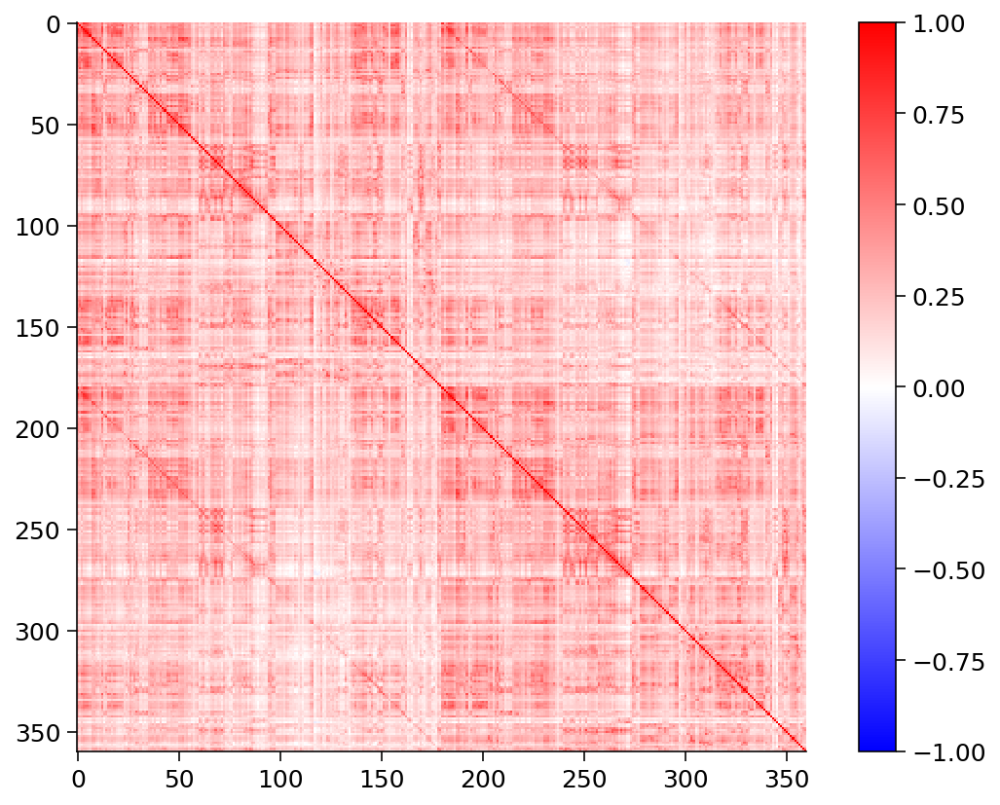

In [ ]:
fc = np.zeros((N_SUBJECTS, N_PARCELS, N_PARCELS))
for sub, ts in enumerate(timeseries_rest):
  # ts shape is 360 for 4800
  fc[sub] = np.corrcoef(ts)

group_fc = fc.mean(axis=0)

plt.imshow(group_fc, interpolation="none", cmap="bwr", vmin=-1, vmax=1)
plt.colorbar()
plt.show()

Plot the profile of FC values between a particular "seed" parcel and every parcel in the dataset, separated by hemisphere:

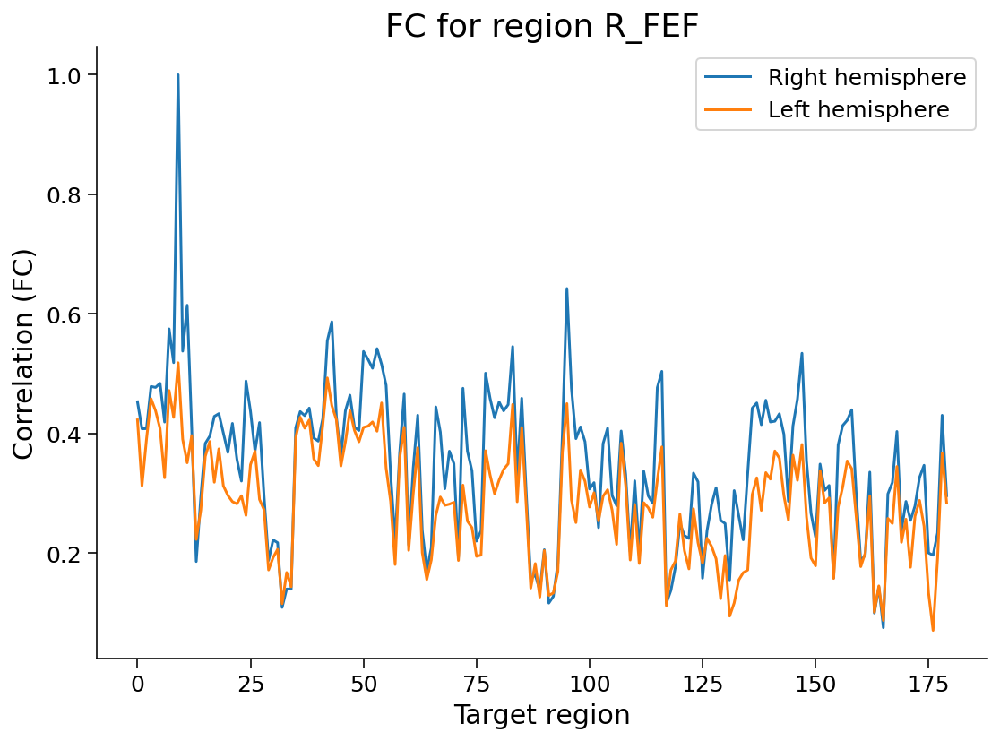

In [ ]:
seed_roi = "R_FEF"  # name of seed parcel
ind = region_info["name"].index(seed_roi)

hemi_fc = np.split(group_fc, 2)

# Plot the FC profile across the right and left hemisphere target regions
for i, hemi_fc in enumerate(hemi_fc):
  plt.plot(hemi_fc[:, ind], label=f"{HEMIS[i]} hemisphere")
plt.title(f"FC for region {seed_roi}")
plt.xlabel("Target region")
plt.ylabel("Correlation (FC)")
plt.legend()
plt.show()

# Task analyses

Description of each task, task timing, and conditions is located [here](https://protocols.humanconnectome.org/HCP/3T/task-fMRI-protocol-details.html).

These are the condition names for each task:

```
- MOTOR: cue, lf, lh, rf, rh, t
- WM:
    0bk_body, 0bk_faces, 0bk_nir, 0bk_placed, 0bk_tools, 
    2bk_body, 2bk_faces, 2bk_nir, 2bk_placed, 2bk_tools,
    0bk_cor, 0bk_err,
    2bk_cor, 2bk_err,
    all_bk_cor, all_bk_err
- EMOTION: feat, neutral
- GAMBLING: loss, loss_event, win, win_event, neut_event
- LANGUAGE:
    cue,
    math, story
    present_math, present_story,
    question_math, question_story,
    response_math, response_story
- RELATIONAL: error, match, relation
- SOCIAL: mental_resp, mental, other_resp, rnd
```

## Load individual runs for a given task

Load each subject's data for a specific task, separately for each run:

In [31]:
timeseries_task_motor = []
for subject in subjects:
  timeseries_task_motor.append(load_timeseries(subject, "motor"))

In [32]:
timeseries_task_lang = []
for subject in subjects:
  timeseries_task_lang.append(load_timeseries(subject, "language"))

## Run a simple subtraction analysis

In [ ]:
help(load_evs)

Help on function load_evs in module __main__:

load_evs(subject, name, condition)
    Load EV (explanatory variable) data for one task condition.
    
    Args:
      subject (int): 0-based subject ID to load
      name (str) : Name of task
      condition (str) : Name of condition
    
    Returns
      evs (list of dicts): A dictionary with the onset, duration, and amplitude
        of the condition for each run.



In [ ]:
help(selective_average)

Help on function selective_average in module __main__:

selective_average(timeseries_data, ev, skip=0)
    Take the temporal mean across frames for a given condition.
    
    Args:
      timeseries_data (array or list of arrays): n_parcel x n_tp arrays
      ev (dict or list of dicts): Condition timing information
      skip (int) : Ignore this many frames at the start of each trial, to account
        for hemodynamic lag
    
    Returns:
      avg_data (1D array): Data averagted across selected image frames based
      on condition timing



In [ ]:
task = "motor"
conditions = ["lf", "rf"]  # Run a substraction analysis between two conditions

contrast = []
for subject in subjects:

  # Get the average signal in each region for each condition
  evs = [load_evs(subject, task, cond) for cond in conditions]
  avgs = [selective_average(timeseries_task[subject], ev) for ev in evs]

  # Store the region-wise difference
  contrast.append(avgs[0] - avgs[1])

group_contrast = np.mean(contrast, axis=0)

Plot group-averaged contrast value across regions:

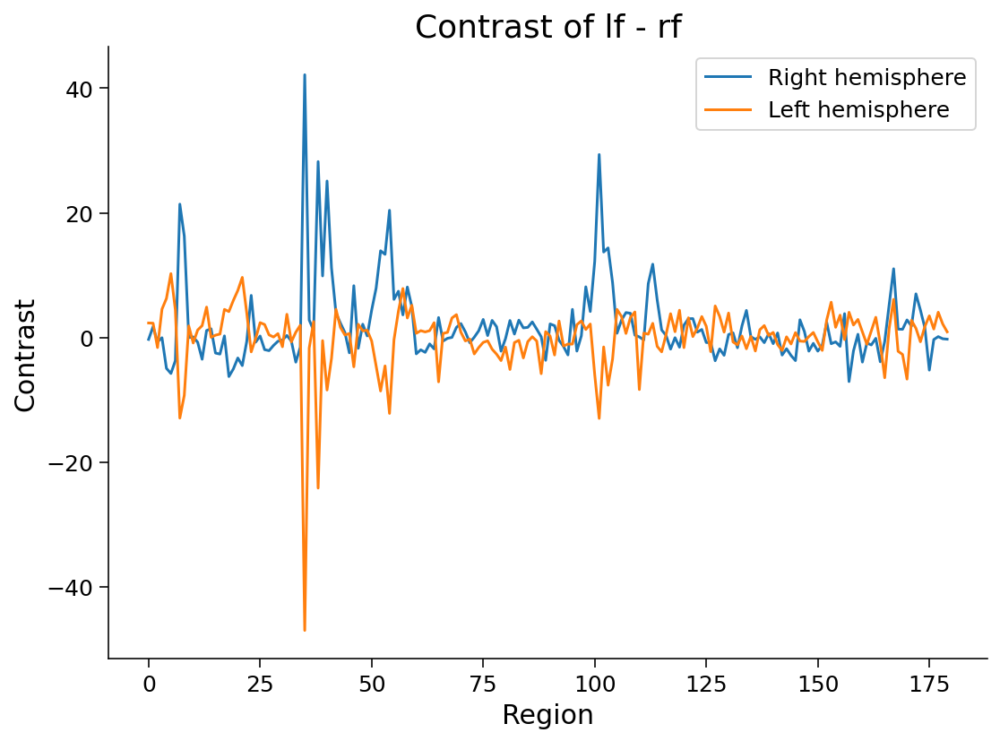

In [ ]:
hemi_contrasts = np.split(group_contrast, 2)

for i, hemi_contrast in enumerate(hemi_contrasts):
  plt.plot(hemi_contrast, label=f"{HEMIS[i]} hemisphere")

plt.title("Contrast of %s - %s" % (conditions[0], conditions[1]))
plt.xlabel("Region")
plt.ylabel('Contrast')
plt.legend()
plt.show()

## Characterize values by functional network

Average the contrast values within parcels belonging to each network and plot:

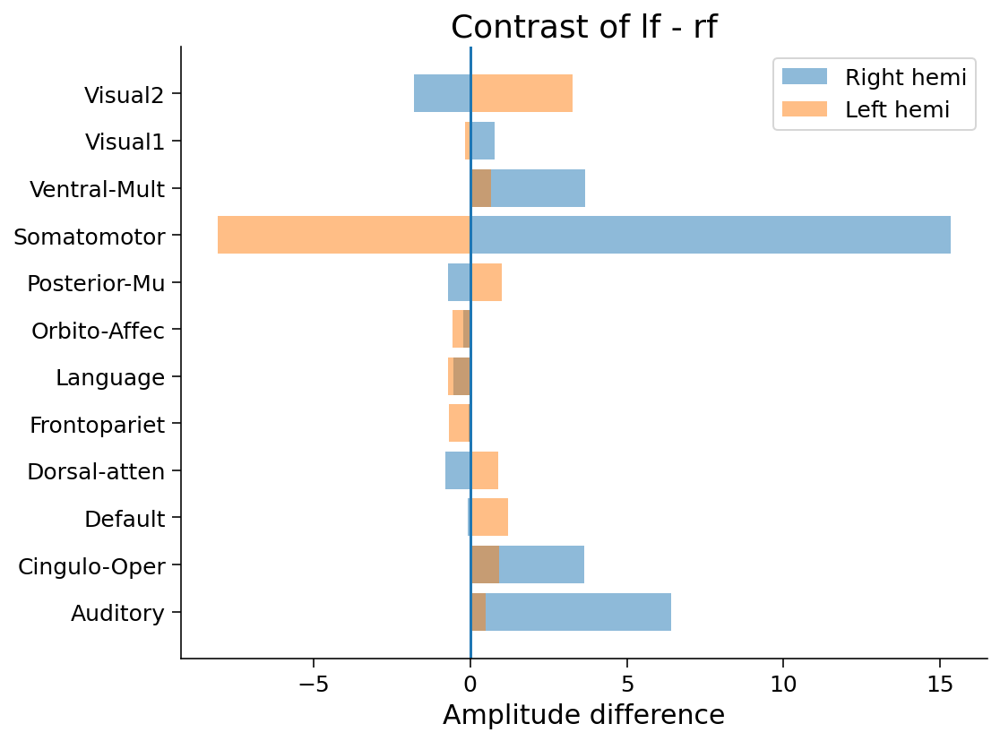

In [ ]:
# Get unique network labels
network_names = np.unique(region_info["network"])

hemi_networks = np.split(region_info["network"], 2)
hemi_contrasts = np.split(group_contrast, 2)

# Get and plot mean contrast value per network, by hemisphere
for hemi, hemi_network, hemi_contrast in zip(HEMIS, hemi_networks, hemi_contrasts):
  network_vals = []
  for network in network_names:
    network_vals.append(hemi_contrast[hemi_network == network].mean())
  plt.barh(network_names, network_vals, alpha=.5, label=f"{hemi} hemi")

plt.axvline(0)
plt.xlabel("Amplitude difference")
plt.title(f"Contrast of {conditions[0]} - {conditions[1]}")
plt.legend()
plt.show()

# Behavioral covariates


## Task performance measures

The dataset also includes aggregate behavior for each task run stored in task-specific `.csv` files. It is possible to load and work with these files using `numpy`:

In [ ]:
wm_behavior = np.genfromtxt("hcp/behavior/wm.csv",
                            delimiter=",",
                            names=True,
                            dtype=None,
                            encoding="utf")
print(wm_behavior[:5])
print(wm_behavior.dtype.names)

[(0, 0, '0BK_BODY', 1., 1., 1.,  705.5,  740.5, 696. )
 (0, 0, '0BK_FACE', 1., 1., 1.,  779.5,  765. , 915. )
 (0, 0, '0BK_PLACE', 1., 1., 1.,  926. ,  993.5, 811.5)
 (0, 0, '0BK_TOOL', 1., 1., 1.,  807.5,  807.5, 807.5)
 (0, 0, '2BK_BODY', 1., 1., 1., 1133. , 1205.5, 732.5)]
('Subject', 'Run', 'ConditionName', 'ACC', 'ACC_NONTARGET', 'ACC_TARGET', 'MEDIAN_RT', 'MEDIAN_RT_NONTARGET', 'MEDIAN_RT_TARGET')


But, while not formally taught as part of the course, [`pandas`](https://pandas.pydata.org/) offers more powerful tools for tabular data analysis.

## Pseudo-demographics

The NMA-distributed version of the HCP data does not contain any real demographic information. But we have created a synthetic dataset of 25 "demographic" variables based on a model trained on the original dataset to predict demographics from resting-state network organization measures:

In [ ]:
demo = np.load("hcp/pseudo_demographics.npy")
demo.shape

(339, 25)

## Original subject IDs

The dataset also contains a key to map the ordinal subject numbers to the IDs used in the original HCP dataset:

In [ ]:
ids = np.loadtxt("hcp/orig_ids.txt")
print(ids[:8])

[199453. 580751. 173435. 919966. 181636. 192843. 894067. 174437.]


## My part
based on https://towardsdatascience.com/granger-causality-and-vector-auto-regressive-model-for-time-series-forecasting-3226a64889a6

### Imports

### Granger Causality -> Code from http://nipy.org/nitime/examples/granger_fmri.html 

In [40]:
! pip install nitime

In [10]:
# import numpy as np
# import matplotlib.pyplot as plt
import datetime
import nitime
import nitime.analysis as nta
import nitime.timeseries as ts
import nitime.utils as tsu
from nitime.viz import drawmatrix_channels
import multiprocessing as mp
from seaborn import heatmap
import seaborn as sns
import pandas as pd
import networkx as nx
from collections import Counter
from scipy.stats import ks_2samp
from itertools import permutations, product

/Users/polinaturiseva/anaconda3/lib/python3.7/site-packages/matplotlib/cbook/deprecation.py:107: MatplotlibDeprecationWarning: The mpl_toolkits.axes_grid module was deprecated in version 2.1. Use mpl_toolkits.axes_grid1 and mpl_toolkits.axisartist provies the same functionality instead.
  warnings.warn(message, mplDeprecation, stacklevel=1)


### Granger Causality
We decides to calculate granger causality as a functional connectivity metric. It may take really long (~hours) to compute it on large amount of data. For HCP it has taken ~24h with multiprocessing on CPU, MacBookPro, Intel Core i7 2,2GHz, 6 Cores, 6 processes

In [11]:
f_ub = 0.15
f_lb = 0.02

coh_av = []
g1_av = []
g2_av = []
Gs = []
C1s = []
C2s = [] 
corrs = []


def resting_state_granger(i, task):

  timeseries_rest = load_timeseries(i, task)
  print(f'{i} {task} : {datetime.datetime.now().time()}')
  time_series = ts.TimeSeries(timeseries_rest, sampling_interval=0.7)
  G = nta.GrangerAnalyzer(time_series, order=1)
  C1 = nta.CoherenceAnalyzer(time_series)
  C2 = nta.CorrelationAnalyzer(time_series)
  corrs = C2.corrcoef
  freq_idx_G = np.where((G.frequencies > f_lb) * (G.frequencies < f_ub))[0]
  freq_idx_C = np.where((C1.frequencies > f_lb) * (C1.frequencies < f_ub))[0]
  coh_av = np.mean(C1.coherence[:, :, freq_idx_C], -1)  # Averaging on the last dimension
  g1_av = np.mean(G.causality_xy[:, :, freq_idx_G], -1)
  g2_av = np.mean(G.causality_xy[:, :, freq_idx_G] - G.causality_yx[:, :, freq_idx_G], -1)

  return i, coh_av, g1_av, g2_av, corrs

In [12]:
tasks = ['motor', 'social', 'wm', 'gambling', 'relational', 'emotion', 'language', 'rest']

In [12]:
# for t in tasks:
#     print(f'{t} IS STARTED')
#     with mp.Pool(6) as pool:
#       outputs = pool.starmap(resting_state_granger, product(range(339), [t]))
#     print(f'{t} IS FINISHED')
#     nums, coh_av_, g1_av_, g2_av_, corrs_ = map(list, zip(*outputs))
#     np.save(f"{t}/g1_av", np.asarray(g1_av_).reshape((N_SUBJECTS, N_PARCELS, N_PARCELS)))
#     np.save(f"{t}/numbers", np.asarray(nums))
#     np.save(f"{t}/g2_av", np.asarray(g2_av_).reshape((N_SUBJECTS, N_PARCELS, N_PARCELS)))
#     np.save(f"{t}/corrs", np.asarray(corrs_).reshape((N_SUBJECTS, N_PARCELS, N_PARCELS)))
#     np.save(f"{t}/coh_av", np.asarray(coh_av_).reshape((N_SUBJECTS, N_PARCELS, N_PARCELS)))
#     print(f'{t} IS SAVED')

In [125]:
# f_ub = 0.15
# f_lb = 0.02
# k = 0
# j = 70

# with mp.Pool(6) as pool:
#   outputs = pool.map(resting_state_granger, range(339), t)

In [13]:
def load_one(filename, average=True):
    '''
    loads .npy file for each task and 
    averages between subjects if averages is True
    '''
    file = np.load(f'{filename}.npy')
#     remove nans
    file [np.isnan(file)]=0
    if average:
        file = np.mean(file, axis=0)
    return file


def draw_half_heatmap(data, size):
    '''
    draws triangle heatmap because 
    one half of granger matrix is filled with zeros
    (granger causality does not support biderectional connectivity by default)
    '''
    df = pd.DataFrame(data, columns=regions[0], index=regions[0])
    mask = np.zeros_like(df.T)
    mask[np.triu_indices_from(mask)] = True
    with sns.axes_style("white"):
        f, ax = plt.subplots(figsize=size)
        ax = sns.heatmap(df.T, mask=mask, vmax=.3, square=True)

In [14]:
def matrix_to_graph(matrix):
    '''
    transforms connectivity matrix to a preliminary df for graph construction
    '''
    df_nx = pd.DataFrame(matrix, columns=regions[0], index=regions[0])
    links = df_nx.stack().reset_index()
    links.columns = ['var1', 'var2','weight']
    # Keep only correlation over a 0 and remove self correlation (cor(A,A)=1)
    links_filtered=links.loc[ (links['weight'] > 0) & (links['var1'] != links['var2']) ]
    
    return links_filtered


def one_to_one_connections(links_filtered):
    '''
    returns triple of isolated one-to-one sequetially connected nodes
    '''
    once1 = set(links_filtered[links_filtered.groupby('var1').var1.transform(len) == 1]['var1'])
    once2 = set(links_filtered[links_filtered.groupby('var2').var2.transform(len) == 1]['var2'])
    more1 = set(links_filtered[links_filtered.groupby('var1').var1.transform(len) > 1]['var1'])
    more2 = set(links_filtered[links_filtered.groupby('var2').var2.transform(len) > 1]['var2'])
    inter = set.intersection(once1, once2)
    inter = set.union(inter, more1, more2)
    links_filtered = links_filtered[~links_filtered['var1'].isin(inter)]
    links_filtered = links_filtered[~links_filtered['var2'].isin(inter)]
    
    return links_filtered

In [15]:
def draw_graph_with_heatmap(G, save = False, path_to_save=None, name = None):
    '''
    draw circular directed graph with labeled nodes
    the color of the edge corresponds to the strength of the connection
    as a heatmap, the labels are down
    '''
    # inspired by 
    # https://stackoverflow.com/questions/38534730/add-legend-to-networks-plot-to-explain-colouring-of-nodes
    
    #creating a color list for each edge based on weight

    a_netw_edges = G.edges()
    a_netw_weights = [G[source][dest]['weight'] for source, dest in a_netw_edges]

    #scale weights in range 0-1 before assigning color 
    maxWeight=float(max(a_netw_weights))
    a_netw_colors = [plt.cm.Blues(weight/maxWeight) for weight in a_netw_weights]


    #suppress plotting for the following dummy heatmap
    plt.ioff()

    #multiply all tuples in color list by scale factor
    colors_unscaled=[tuple(map(lambda x: maxWeight*x, y)) for y in a_netw_colors]
    heatmap = plt.pcolor(colors_unscaled,cmap=plt.cm.Blues)
                         
    #re-enable plotting
    plt.ion()
    fig,axes = plt.subplots(figsize=(50,35))
    nx.draw_circular(G, edges=a_netw_edges, width=1, edge_color=a_netw_colors, ax=axes, 
                     with_labels=True, font_size=7, font_weight = 'bold')
    axes.get_xaxis().set_visible(False)
    axes.get_yaxis().set_visible(False)

    #add colorbar

    cbar = plt.colorbar(heatmap, orientation="horizontal", pad=0.0001)
    cbar.ax.set_ylabel('edge weight',labelpad=10)
    if save:
        plt.savefig(f'{path_to_save}/{name}.png', dpi=300)

In [16]:
# Calculating and drawing the graphs for each task

# thresholds = [0.01, 0.05, 0.1]
thresholds = [0.08]
isolated = {}
degrees = {}

for task in tasks:
    print(task)
    matrix = load_one(f'{task}/g1_av', average=True)
    for t in thresholds:
        matrix[matrix<=t]=0
        links = matrix_to_graph(matrix)
        isol = one_to_one_connections(links)
        links_denser = pd.concat([links,isol]).drop_duplicates(keep=False) 
        G = nx.from_pandas_edgelist(links_denser, source='var1', target = 'var2', 
                                     edge_attr='weight', create_using =nx.DiGraph())
        isolated[f'{task}-{t}'] = isol
        degrees[f'{task}-{t}'] = G.degree
#         draw_graph_with_heatmap(G, save = True, path_to_save=f'graphs/{task}', name = f'g1_{t}')
        
        

motor
social
wm
gambling
relational
emotion
language
rest


## Comparision of connections bw tasks

In [17]:
def shared_and_spesific_edges(bin1, bin2):
    '''
    returns differences in strength in connections bw 2 tasks
    '''
    dif = (bin1 - bin2).stack().reset_index()
    dif.columns = ['var1', 'var2','weight'] 
    dif_without_0 = dif.loc[ (dif['weight'] != 0) & (dif['var1'] != dif['var2']) ]
    spec_bin1 = dif_without_0.loc[ (dif_without_0['weight'] == 1)]
    spec_bin2 = dif_without_0.loc[ (dif_without_0['weight'] == -1)]
    shared = (bin1.stack().reset_index()).merge((bin2.stack().reset_index()), how = 'inner' ,indicator=False)
    shared.columns = ['var1', 'var2','weight'] 
    shared = shared.loc[ (shared['weight'] != 0) & (shared['var1'] != shared['var2']) ]
    return spec_bin1, spec_bin2, shared


def shared_and_specific_by_names(name1, name2, thres=0.08, mode='bin'):
    '''
    returns shared and uniques connections bw 2 tasks
    '''
    m1 = load_one(f'{name1}/g1_av', average=True)
    m2 = load_one(f'{name2}/g1_av', average=True)
    m1[m1<=thres]=0
    m2[m2<=thres]=0
    if mode=='bin':
        m1[m1>0]=1
        m2[m2>0]=1
        m1 = pd.DataFrame(m1, columns=regions[0], index=regions[0])
        m2 = pd.DataFrame(m2, columns=regions[0], index=regions[0])
        return shared_and_spesific_edges(m1, m2)
    
    else:
        m1 = pd.DataFrame(m1, columns=regions[0], index=regions[0])
        m2 = pd.DataFrame(m2, columns=regions[0], index=regions[0])
        dif = (m1-m2).stack().reset_index()
        dif.columns = ['var1', 'var2','weight']
        dif = dif.loc[ (dif['weight'] != 0) & (dif['var1'] != dif['var2']) ]
        
        shared = (m1.stack().reset_index()).merge((m2.stack().reset_index()), how = 'inner' ,indicator=False)
        shared.columns = ['var1', 'var2','weight'] 
        shared = shared.loc[ (shared['weight'] != 0) & (shared['var1'] != shared['var2']) ]
        
        return dif, shared
    
    
def network_by_name(name):
    '''
    return network name by ROI name
    '''
    return region_info['network'][region_info['name'].index(name)]


def common_networks(shared):
    '''
    common networks and the distribution among shared connections
    '''
    v1 = shared['var1'].values
    v2 = shared['var2'].values
    n1 = []
    n2 = []
    for i in range(len(v1)):
        n1.append(network_by_name(v1[i]))
        n2.append(network_by_name(v2[i]))
        
    n1_c = Counter(n1)
    n1_c = {k: v for k, v in sorted(n1_c.items(), key=lambda item: item[1], reverse=True)}
    n2_c = Counter(n2)
    n2_c = {k: v for k, v in sorted(n2_c.items(), key=lambda item: item[1], reverse=True)}
    
    pairs = Counter(list(zip(n1, n2)))
    pairs = {k: v for k, v in sorted(pairs.items(), key=lambda item: item[1], reverse=True)}

    
    return n1_c, n2_c, n1, n2, pairs


def degrees_network_distribution(degrees, threshold=20, draw = True):
    '''
    takes nodes with degrees above thresolhd and 
    draws their distribution among networks
    '''
    aboves = []
    names = []
    for i in range(len(degrees.columns)):
        aboves.append(Counter([network_by_name(j) for j in degrees[degrees.iloc[:, i] >= threshold].index]))
        names.append(degrees.columns[i])
      
    nets = Counter(region_info['network'])
    
    if draw:
        fig=plt.figure(figsize=(20, 20))
        columns = 2
        rows = 4
        for i in range(1, columns*rows +1):
            fig.add_subplot(rows, columns, i)
            loc_above = {k: aboves[i-1][k]/nets[k] for k in nets.keys() & aboves[i-1]}
            keys, values = loc_above.keys(), loc_above.values()
            plt.bar(range(len(values)), values)
            plt.xticks(range(len(values)), keys)
            plt.xticks(rotation=15)
            plt.title(names[i-1])
            
        plt.show()
        
    return aboves, names   

In [24]:
def degrees_to_df(degrees, save=False, th=None):
    '''
    transform degree dictionary to pandas dataframe
    '''
    tasks_without_rest = ['motor', 'social', 'wm', 'gambling', 
                          'relational', 'emotion', 'language']
    
    deg = (dict(degrees[f'rest-{th}']))
    deg = pd.DataFrame.from_dict(deg, orient='index', columns=['rest'])

    for t in tasks_without_rest:
        d = (dict(degrees[f'{t}-{th}']))
        d = pd.DataFrame.from_dict(d, orient='index', columns=[t])
        deg = pd.concat([deg, d], axis=1, sort=False)

    deg = deg.fillna(0) 
    
    if save:
        deg.to_csv(f'degrees_{th}.csv')
    return deg 

In [18]:
spec_bin1, spec_bin2, shared =shared_and_specific_by_names('rest', 'motor')

In [19]:
n1_c, n2_c, n1, n2, pairs = common_networks(spec_bin2)

In [20]:
n1_c, n2_c, n1, n2, pairs = common_networks(shared)

Cingulo-Oper network -> attentional control    

Somatomotor -> ~ motor of the body (somatic is related to body) 

## Kolmogorov-Smirnov test to check if degrees distributions are the same

results of KS test, where p-value above 5 % (all statistics ~5% or above)

* 'emotion-gambling': Ks_2sampResult(statistic=0.0453257790368272, pvalue=0.8621077592873074)
* 'emotion-wm': Ks_2sampResult(statistic=0.08781869688385269, pvalue=0.13144753220216154)
* 'motor-rest': Ks_2sampResult(statistic=0.056657223796033995, pvalue=0.6233186916980161)
* 'language-wm': Ks_2sampResult(statistic=0.0453257790368272, pvalue=0.8621077592873074)
* 'gambling-wm': Ks_2sampResult(statistic=0.10198300283286119, pvalue=0.050822085834195896)

results of KS test, where p-value above 1 % but less than 5 (all statistics ~10% or above)

* 'emotion-language': Ks_2sampResult(statistic=0.10764872521246459, pvalue=0.03338583369288762)
* 'gambling-language': Ks_2sampResult(statistic=0.11898016997167139, pvalue=0.013450274386021683)
* 'gambling-relational': Ks_2sampResult(statistic=0.12181303116147309, pvalue=0.010563221992983636)
* 'language-motor': Ks_2sampResult(statistic=0.10764872521246459, pvalue=0.03338583369288762)
* 'motor-wm': Ks_2sampResult(statistic=0.11331444759206799, pvalue=0.02143508300051072)

results of KS test, where p-value above 0.1% (5/28 (~0.17) - by Bonferroni) but less than 1 (all statistics ~14% or above)

* 'emotion-relational': Ks_2sampResult(statistic=0.141643059490085, pvalue=0.0016569852337350074),
* 'gambling-motor': Ks_2sampResult(statistic=0.14447592067988668, pvalue=0.0012427389256109503)

In [25]:
degrees = degrees_to_df(degrees, th=0.08)
k = list(permutations( degrees.columns.values, 2))
k = sorted(set(tuple(sorted(i)) for i in k))
distribs_ordered = {}
for i in k :
    distribs_ordered[f'{i[0]}-{i[1]}']= ks_2samp (sorted(degrees[i[0]].values), sorted(degrees[i[1]].values))

In [26]:
d = pd.DataFrame(np.zeros((7, 7)))
loc_tasks = ['emotion', 'gambling', 'relational', 'language', 'wm', 'motor',  'rest' ]
d.columns = loc_tasks
d.index = loc_tasks
for i in distribs_ordered.keys():
    if distribs_ordered[i][1]>=0.001:
        names = i.split('-')
        d[names[0]][names[1]] = distribs_ordered[i][1]
        d[names[1]][names[0]] = distribs_ordered[i][1]

/Users/polinaturiseva/anaconda3/lib/python3.7/site-packages/seaborn/matrix.py:603: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)
/Users/polinaturiseva/anaconda3/lib/python3.7/site-packages/seaborn/matrix.py:603: ClusterWarning: scipy.cluster: The symmetric non-negative hollow observation matrix looks suspiciously like an uncondensed distance matrix
  metric=self.metric)


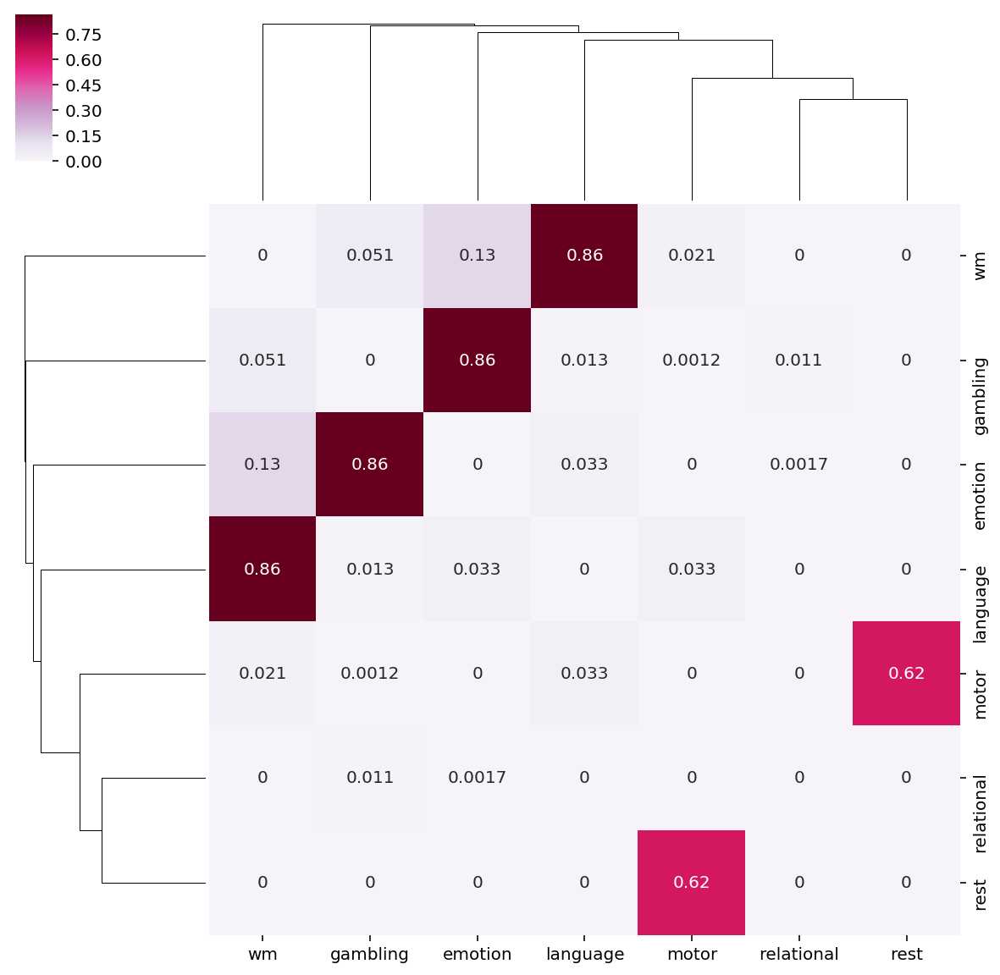

In [27]:
sns.clustermap(d, annot=True, vmin=0, vmax=0.86,  cmap="PuRd" )

## Hemisphere comparision

In [28]:
def draw_degrees_dist_without_zeros(degr):
    '''
    draw ordinary and cumulative distributions
    pictures will be saved to local directory
    '''
    for t in tasks:
        print(t)
        deg_c = deg[t][deg[t].fillna(0) >0]
        
        plt.hist(deg_c, color = 'blue', edgecolor = 'black', bins = deg_c.max().values[0] )
        plt.title(f'Degrees distribution for {t} task')
        plt.savefig(f'{t}_degrees.png')
        plt.clf()
        plt.hist(deg_c, color = 'blue', edgecolor = 'black', cumulative=True, bins = deg_c.max().values[0])
        plt.title(f'Cumulative degrees distribution for {t} task')
        plt.savefig(f'{t}_cumulative_degrees.png')
        plt.clf()
        
        
def dict_to_txt(dictionary, filename):
    '''
    writes dictionary as txt to the current directory
    '''
    with open(f'{filename}.txt', 'w') as f:
        print(dictionary, file=f)
        
        
def find(degrees, threshold):
    '''
    takes only ROIs with degrees above the threshold and
    finds if they have a symmetric pair in the other brain hemisphere
    '''
    find_symmetry = {}

    for t in tasks:
        tr = degrees[t][degrees[t].fillna(0) >threshold]
        tr_values = tr.index.values
        cleared_values = set(tt[1:] for tt in tr_values)
        matches = []
        for c in cleared_values:
            matching = [s for s in tr_values if c in s]
            matches.append(matching)
            asym = []
            sym = []
            manual = []
            for m in matches:
                if len(m)==1:
                    asym.append(m)
                elif len(m)==2 and m[0][1:]==m[1][1:]:
                    sym.append(m)
                elif len(m)==2:
                    asym.append(m[0])
                    asym.append(m[1])
                else:
                    manual.append(m)

        find_symmetry[t] = {'asym':asym, 'sym':sym, 'manual': manual}
        
        return find_symmetry

In [30]:
only_right = []
only_left = []

for i in degrees.T.columns:
    if 'R_' in i:
        only_right.append(i)
    else:
        only_left.append(i)

right_sum = degrees.T[only_right].T.sum()
left_sum = degrees.T[only_left].T.sum()
overal_sum = degrees.sum()

In [31]:
(right_sum - left_sum)/overal_sum

rest          0.000751
motor         0.032861
social        0.044528
wm           -0.025060
gambling      0.063949
relational   -0.033907
emotion       0.047217
language     -0.004673
dtype: float64

## Sample results

In [32]:
wm = load_one('wm/g1_av')

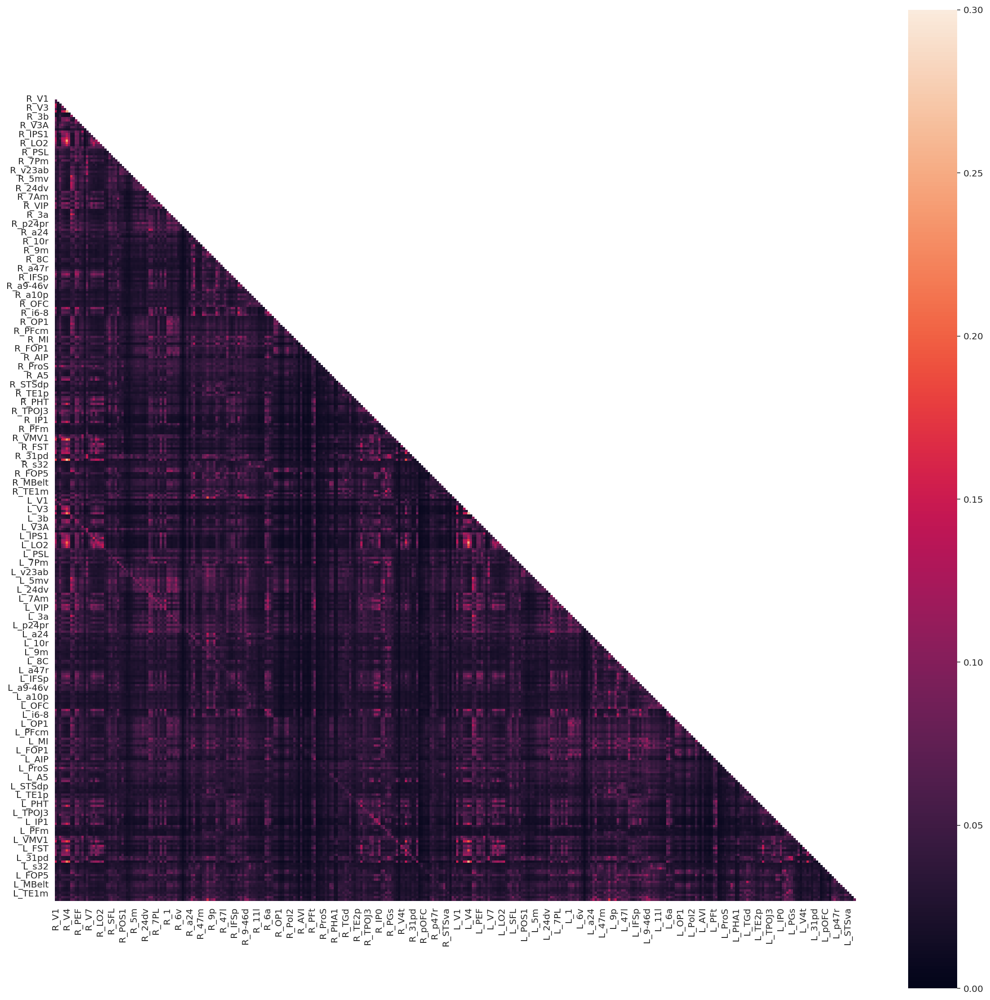

In [33]:
# granger causality matrix
df = pd.DataFrame(wm, columns=regions[0], index=regions[0])

mask = np.zeros_like(df.T)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(20, 20))
    ax = sns.heatmap(df.T, mask=mask, vmax=.3, square=True)

In [40]:
wm_th = load_one('wm/g1_av')
wm_th[wm_th<0.08]=0
df_nx = pd.DataFrame(wm_th, columns=regions[0], index=regions[0])

In [38]:
links = df_nx.stack().reset_index()
links.columns = ['var1', 'var2','weight']
# Keep only correlation over a threshold and remove self correlation (cor(A,A)=1)
links_filtered=links.loc[ (links['weight'] > 0) & (links['var1'] != links['var2']) ]

In [325]:
# works only for undirected graphs
# gr = list(nx.connected_component_subgraphs(G))
# gr2= nx.to_pandas_edgelist(mur[0])

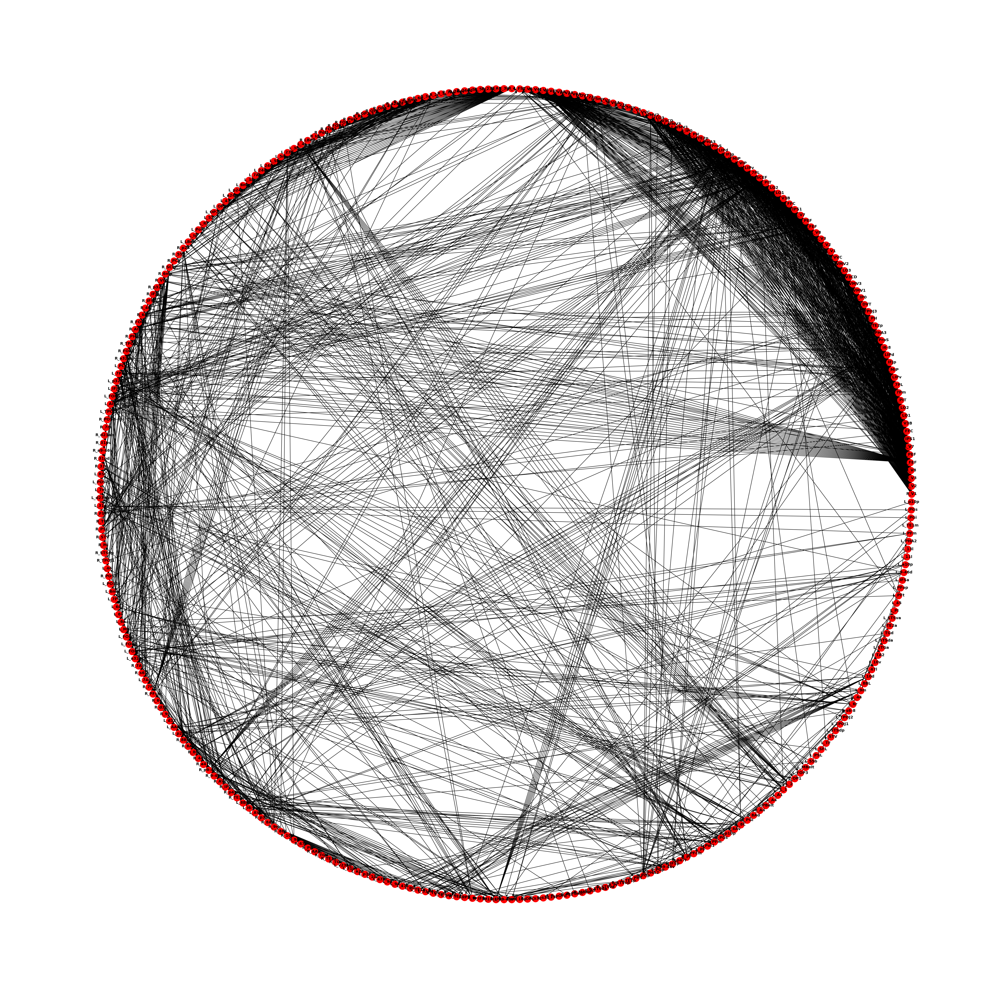

In [39]:
# sample graph
G=nx.from_pandas_edgelist(links_filtered, source='var1', target = 'var2', 
                          edge_attr='weight', create_using =nx.DiGraph())
 
# Plot the network:
plt.figure(3,figsize=(35,35)) 
nx.draw_circular(G, with_labels=True, font_size=10, font_weight = 'bold')

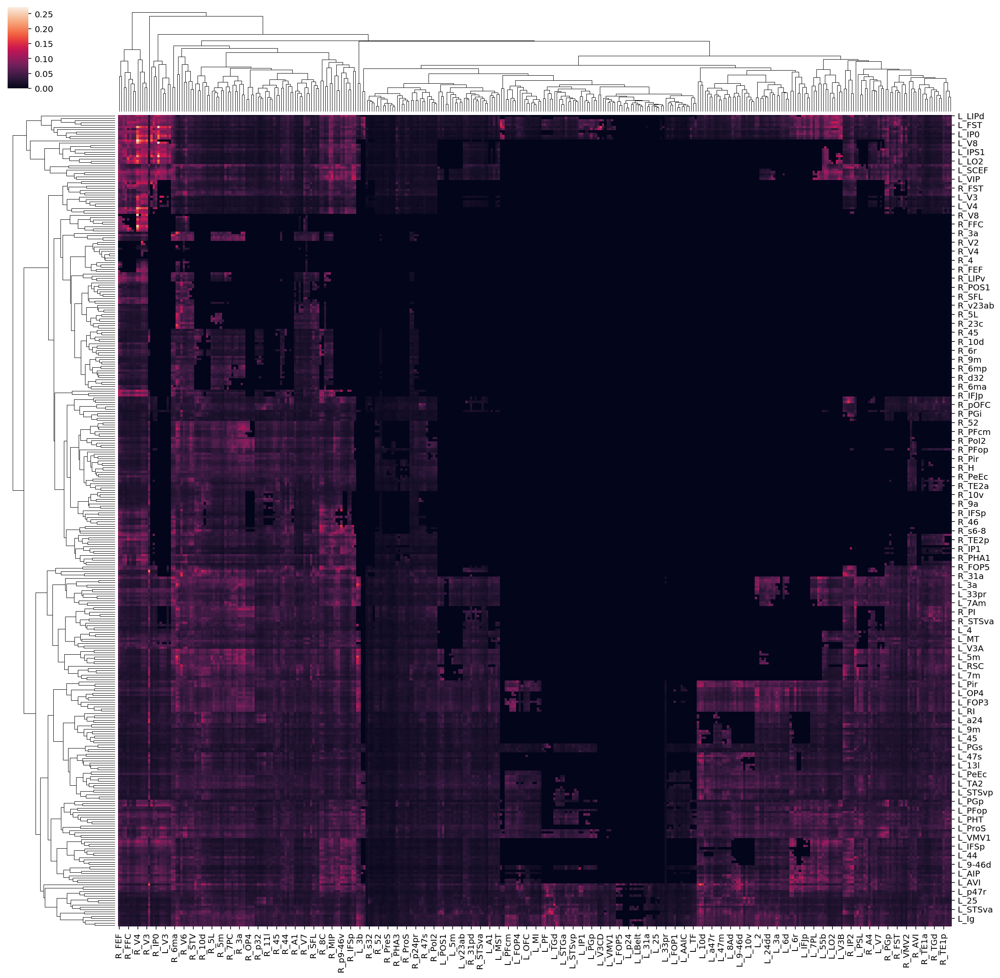

In [41]:
sns.clustermap(df.T, figsize=(20,20) )

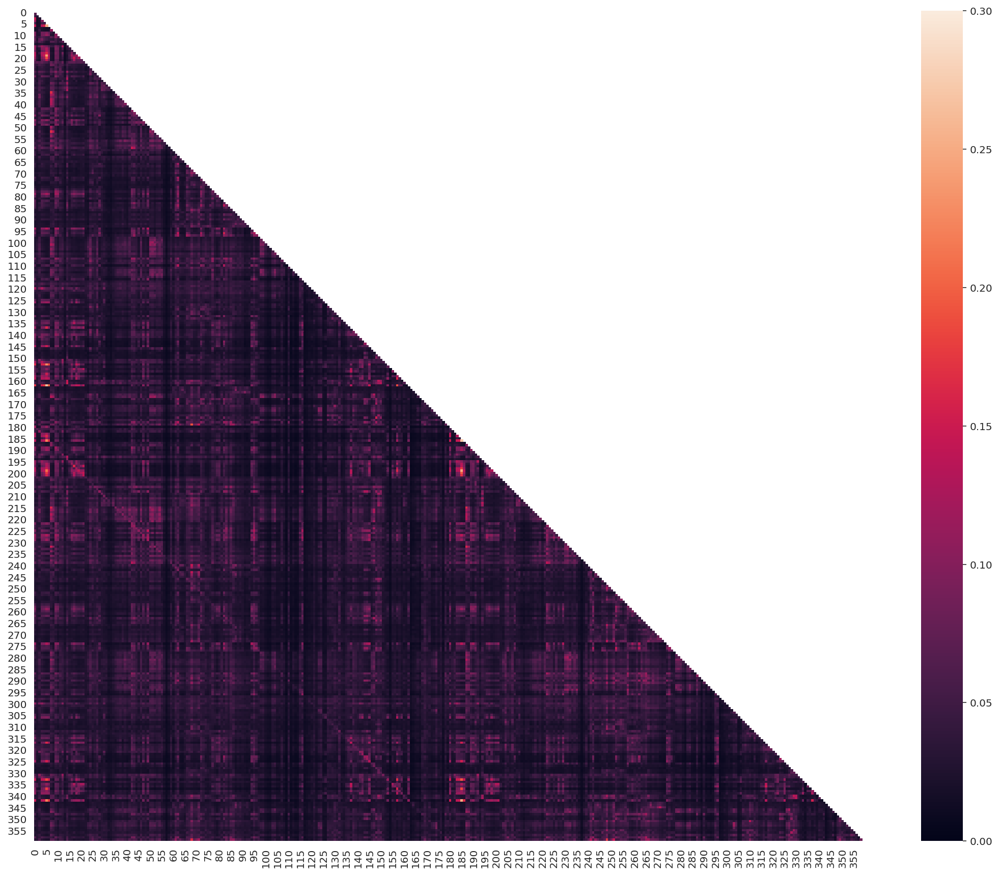

In [42]:
mask = np.zeros_like(wm.T)
mask[np.triu_indices_from(mask)] = True
with sns.axes_style("white"):
    f, ax = plt.subplots(figsize=(20, 15))
    ax = sns.heatmap(wm.T, mask=mask, vmax=.3, square=True)

## Technical notes

Ways to speed up python https://colab.research.google.com/drive/1nMDtWcVZCT9q1VWen5rXL8ZHVlxn2KnL#scrollTo=LNR1Ko74Jv3- 

Maybe look after what Johansen function is https://nbviewer.jupyter.org/github/mapsa/seminario-doc-2014/blob/master/cointegration-example.ipynb   

Note on multiprocessing - do not copy data   
360* 360* 339*4 /1024 /1024 ~2200 Mb = 2.2 Ggb and RAM is only 8 ...


## Try it after 
https://pyvis.readthedocs.io/en/latest/